In [1]:
import numpy as np
import libpysal as ps 
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.diagnostics import get_AICc
from utils import shift_colormap, truncate_colormap
import matplotlib.pyplot as plt
import matplotlib as mpl

# import ipywidgets as widgets
from IPython.display import display
import geopandas as gpd
import pandas as pdz
import libpysal as ps 
from mgwr.gwr import GWR
import matplotlib.pyplot as plt

import ipywidgets as widgets
from IPython.display import display, HTML
import geopandas as gpd
import pandas as pd
import libpysal as ps 
from mgwr.gwr import GWR
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("countypres_2000-2020.csv")
df2 = pd.read_csv("voting_2020.csv")[["county_id","pct_black", "total_pop", 
                                                "pct_hisp", "median_income",
                                               "pct_65_over", "pct_age_18_29", 
                                                "pct_fb", "sex_ratio", "ln_pop_den",
                                               "pct_bach", "pct_uninsured", "median_income"]]

dfgp  = pd.read_csv("ggp-us-dfii.csv").drop('delete', axis=1)

df3 = dfgp[['id', 'se0', 'b0', 'Intercept','sepct_black',
       'bpct_black', 'sepct_hisp', 'bpct_hisp', 'sepct_65_over', 'bpct_65_over', 'sepct_age_18_29',
       'bpct_age_18_29', 'sepct_fb', 'bpct_fb', 'sepct_uninsured',
       'bpct_uninsured', 'sepct_bach', 'bpct_bach', 'seln_pop_den',
       'bln_pop_den']]

In [3]:
dfgp.columns

Index(['ln_pop_den', 'pct_65_over', 'pct_age_18_29', 'pct_bach', 'pct_black',
       'pct_fb', 'pct_hisp', 'pct_uninsured', 'totalvotes', 'id', 'Intercept',
       'X', 'Y', 'se0', 'b0', 'sepct_black', 'bpct_black', 'sepct_hisp',
       'bpct_hisp', 'sepct_65_over', 'bpct_65_over', 'sepct_age_18_29',
       'bpct_age_18_29', 'sepct_fb', 'bpct_fb', 'sepct_uninsured',
       'bpct_uninsured', 'sepct_bach', 'bpct_bach', 'seln_pop_den',
       'bln_pop_den'],
      dtype='object')

In [4]:
df = df[(df.year==2020) & (df.party=='DEMOCRAT') & (df.state!='DISTRICT OF COLUMBIA')] 

In [5]:
df = df[["state", "county_name", "county_fips","party", "totalvotes", "mode"]]

In [6]:
df3.head()

,id,se0,b0,Intercept,sepct_black,bpct_black,sepct_hisp,bpct_hisp,sepct_65_over,bpct_65_over,sepct_age_18_29,bpct_age_18_29,sepct_fb,bpct_fb,sepct_uninsured,bpct_uninsured,sepct_bach,bpct_bach,seln_pop_den,bln_pop_den
0,1001,0.109232,-0.161032,1,0.036349,0.046597,0.283512,-0.126066,0.070951,0.043623,0.052382,-0.056577,0.155654,0.188183,0.026215,0.031122,0.064936,0.099549,0.097896,0.278338
1,1003,0.136123,-0.102484,1,0.053384,0.012584,0.344177,-0.064931,0.088085,0.087716,0.080351,-0.025321,0.201540,0.212545,0.030258,0.040352,0.083381,0.062685,0.113054,0.310424
2,1005,0.103428,-0.169179,1,0.038307,0.026852,0.244266,0.070468,0.067921,0.037035,0.051885,-0.068431,0.114351,0.084628,0.028243,0.028617,0.066925,0.125253,0.095183,0.361029
3,1007,0.109789,-0.163615,1,0.037532,0.056688,0.297452,-0.309765,0.070533,0.040448,0.051829,-0.051730,0.177065,0.291477,0.025017,0.031500,0.063806,0.086583,0.098996,0.249310
4,1009,0.102830,-0.209484,1,0.051780,0.100776,0.280105,-0.267604,0.064447,0.031542,0.051751,-0.044486,0.178712,0.242935,0.023354,0.026573,0.060796,0.090904,0.099898,0.286709


In [7]:
newdf = df.merge(df2, left_on='county_fips', right_on='county_id', how='right')

In [8]:
newdf = newdf[(newdf['mode']=='TOTAL') | (newdf['mode']=='ELECTION DAY')]

In [9]:
counties = gpd.read_file('https://cdn.jsdelivr.net/npm/us-atlas@3/counties-10m.json')\
                                                                            .sort_values(by='id').reset_index(drop=True)

empty = counties['geometry'].is_empty
counties_non_empty = counties[~empty].copy()

counties_non_empty['lon'] = counties_non_empty['geometry'].centroid.x
counties_non_empty['lat'] = counties_non_empty['geometry'].centroid.y
counties_non_empty['id'] = counties_non_empty['id'].astype('int')

In [10]:
data = counties_non_empty.merge(newdf, left_on='id', right_on='county_fips')

In [11]:
data = data[data.state!='HAWAII']

In [12]:
data.set_crs(epsg=4269, allow_override=True, inplace=True)
data = data.to_crs(epsg=4269)

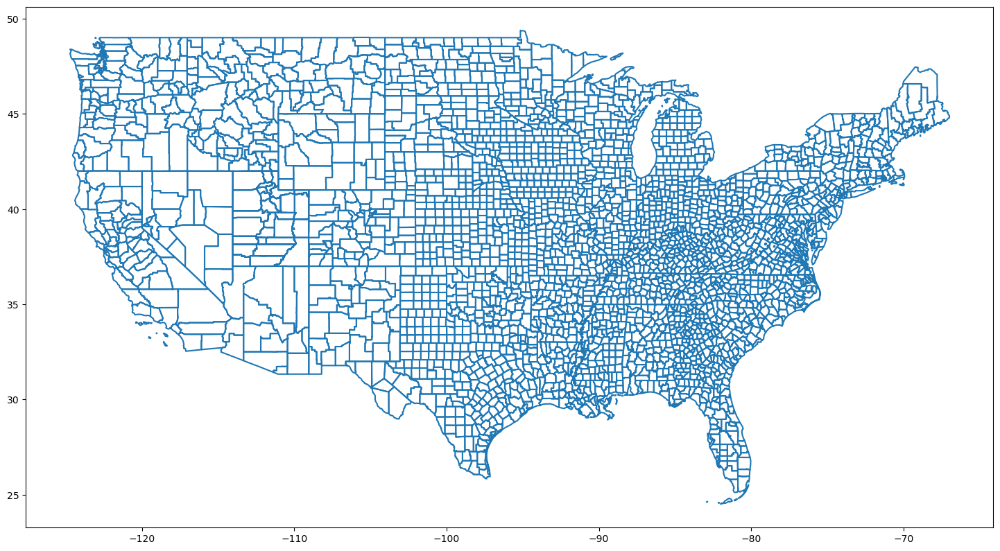

In [13]:
data.boundary.plot(figsize=(18,12));

In [14]:
# data.to_csv('us-data.csv', index=False)

In [15]:
# # data = data[data['total_pop']>5000]
# g_X = data[[
#     'pct_black','pct_hisp','pct_65_over','pct_age_18_29',
#          'name', 'pct_fb', 'pct_uninsured', 'pct_bach', 'ln_pop_den', 'totalvotes'
#             ]]

# g_X = (g_X - g_X.mean(axis=0)) / g_X.std(axis=0)
# g_X['geometry'] = data['geometry']
# g_X['id'] = data['id']
# g_X['name'] = data['name']
# g_X.to_csv('us-data.csv', index=False)

In [16]:
g_y = data['totalvotes'].values.reshape((-1,1))
g_X = data[[
    'pct_black','pct_hisp','pct_65_over','pct_age_18_29',
            'pct_fb', 'pct_uninsured', 'pct_bach', 'ln_pop_den'
            ]].values

g_y = (g_y - g_y.mean(axis=0)) / g_y.std(axis=0)
g_X = (g_X - g_X.mean(axis=0)) / g_X.std(axis=0)

u = data["lon"]
v = data["lat"]

g_coords = list(zip(u,v))

In [17]:
# data.tail().T

In [18]:
gwr_selector = Sel_BW(g_coords, g_y, g_X)
gwr_bw = gwr_selector.search()
gwr_results = GWR(g_coords, g_y, g_X, gwr_bw).fit()
print('Bandwidth is:', gwr_bw)
print('=======================')
print('Resid SS is:', gwr_results.resid_ss)
print('=======================')
print('ENP is:', gwr_results.ENP)
print('=======================')
print('AICc is:', gwr_results.aicc)

gwr_results.summary()

Bandwidth is: 143.0
Resid SS is: 904.7533722425316
ENP is: 451.3961065192949
AICc is: 6058.0439707854275
Model type                                                         Gaussian
Number of observations:                                                3134
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           1987.377
Log-likelihood:                                                   -3733.194
AIC:                                                               7484.387
AICc:                                                              7486.458
BIC:                                                             -23169.077
R2:                                                                   0.366
Adj. R2:                                                              0.364

Variable                       

In [19]:
data1 = gpd.GeoDataFrame(gwr_results.params, geometry=data['geometry'])
data1.columns = ['intercept','pct_black','pct_hisp','pct_65_over','pct_age_18_29',
            'pct_fb', 'pct_uninsured', 'pct_bach', 'ln_pop_den', 'geometry']

data1.head(3)

,intercept,pct_black,pct_hisp,pct_65_over,pct_age_18_29,pct_fb,pct_uninsured,pct_bach,ln_pop_den,geometry
0,-0.172651,0.044825,-0.077558,0.091590,-0.027376,0.049830,0.017239,0.140938,0.395552,"POLYGON ((-86.91684 32.66395, -86.71225 32.661..."
1,-0.202768,0.019876,-0.555221,0.103283,-0.015621,0.390899,-0.084299,-0.019337,0.492291,"POLYGON ((-88.00799 30.68468, -88.02593 30.753..."
2,-0.174044,0.017314,-0.073550,0.013374,-0.030852,0.057955,0.026768,0.168035,0.193026,"POLYGON ((-85.65700 31.88049, -85.64982 31.911..."


In [20]:
tvl = pd.DataFrame(gwr_results.filter_tvals(alpha=0.05))
tvl.columns = ['t_intercept', 't_pct_black','t_pct_hisp','t_pct_65_over',
               't_pct_age_18_29', 't_pct_fb',
            't_pct_uninsured','t_pct_bach','t_ln_pop_den']

In [21]:
tvl.head(2)

,t_intercept,t_pct_black,t_pct_hisp,t_pct_65_over,t_pct_age_18_29,t_pct_fb,t_pct_uninsured,t_pct_bach,t_ln_pop_den
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.268328


In [22]:
merged = data1.merge(tvl, left_index=True, right_index=True)

In [33]:
# merged.to_csv('single_model.csv', index=False)

### GGP-GAM Part

In [23]:
geo = counties_non_empty[['geometry', 'id']]
df3 = df3.merge(geo, left_on='id', right_on='id')

In [24]:
df3_ = gpd.GeoDataFrame(df3, geometry=df3['geometry'])
# df3.drop(['lon', 'lat', 'county_id', 'id'], axis=1, inplace=True)

In [25]:
# df3.to_csv('df3_.csv', index=False)

# Demo

### Utility 1 

- This Utillity of the "svc-viz" tool takes as input a GWR model object and Generates plots incorporating the visualization best practices discussed in the special issue paper to ensure reproducible research

- By default the tool visualizes all the coefficients. The User then only needs to specify which coefficient surfaces they want to visualize by passing them as argument and they could turn the t-values on/off (by default the tvalues are at 0.05 significance level but could be adjusted)

   - Cool thing is it could also be used for other svc models that are not GWR

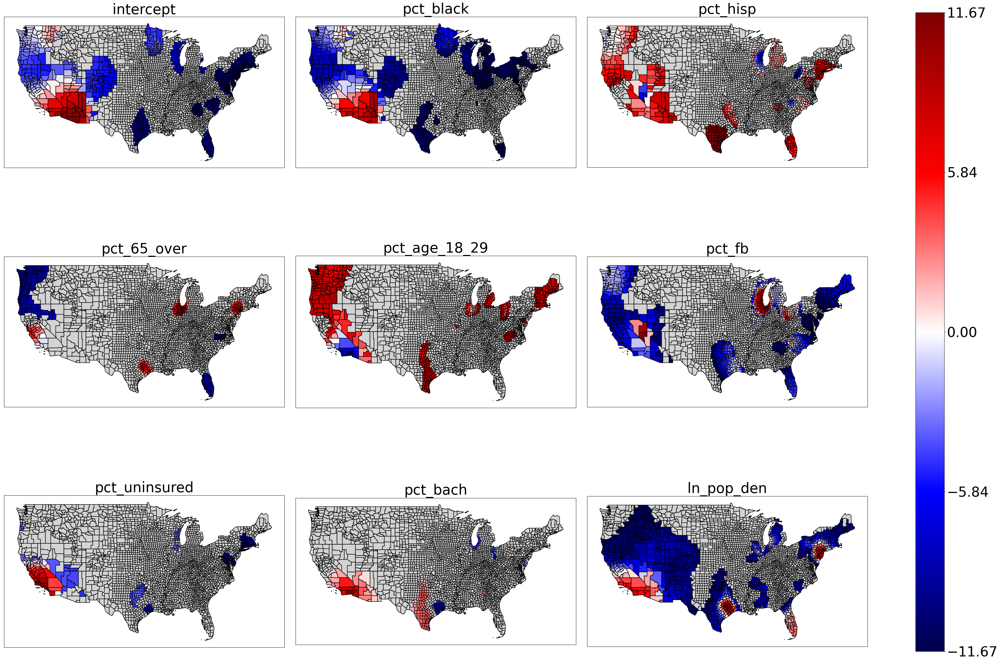

In [34]:
from gwviz import visualize_surfaces

data1 = gpd.GeoDataFrame(gwr_results.params, geometry=data['geometry'])
data1.columns = ['intercept','pct_black','pct_hisp','pct_65_over','pct_age_18_29',
            'pct_fb', 'pct_uninsured', 'pct_bach', 'ln_pop_den', 'geometry']

tvl = pd.DataFrame(gwr_results.filter_tvals(alpha=0.05))
tvl.columns = ['t_intercept', 't_pct_black','t_pct_hisp','t_pct_65_over',
               't_pct_age_18_29', 't_pct_fb',
            't_pct_uninsured','t_pct_bach','t_ln_pop_den']

merged = data1.merge(tvl, left_index=True, right_index=True)

columns = list(merged.columns)  # merged column names of the params and the tvalues
# columnsw

visualize_surfaces(merged, [
                            'intercept',
                            'pct_black',
                            'pct_hisp',
                            'pct_65_over',
                            'pct_age_18_29',
                            'pct_fb',
                            'pct_uninsured',
                            'pct_bach',
                            'ln_pop_den'
                           ], 
                           [
                            't_intercept',
                            't_pct_black',
                            't_pct_hisp',
                            't_pct_65_over',
                            't_pct_age_18_29',
                            't_pct_fb',
                            't_pct_uninsured',
                            't_pct_bach',
                            't_ln_pop_den',
                           ], use_tvalues=True)

The visualization tool takes in 1, 2, or x amount of columns depending on the dataset in particular and would intelligently plot the axes based on the number of columns provided while incorporating the visualization best practices discussed in the R&R paper. <br /> <br /> For each column, you also get the tvalues at 0.05 significance level. And could turn it on or off. More modifications are still underway, but this is enough to complete the section on GWR as replication machines

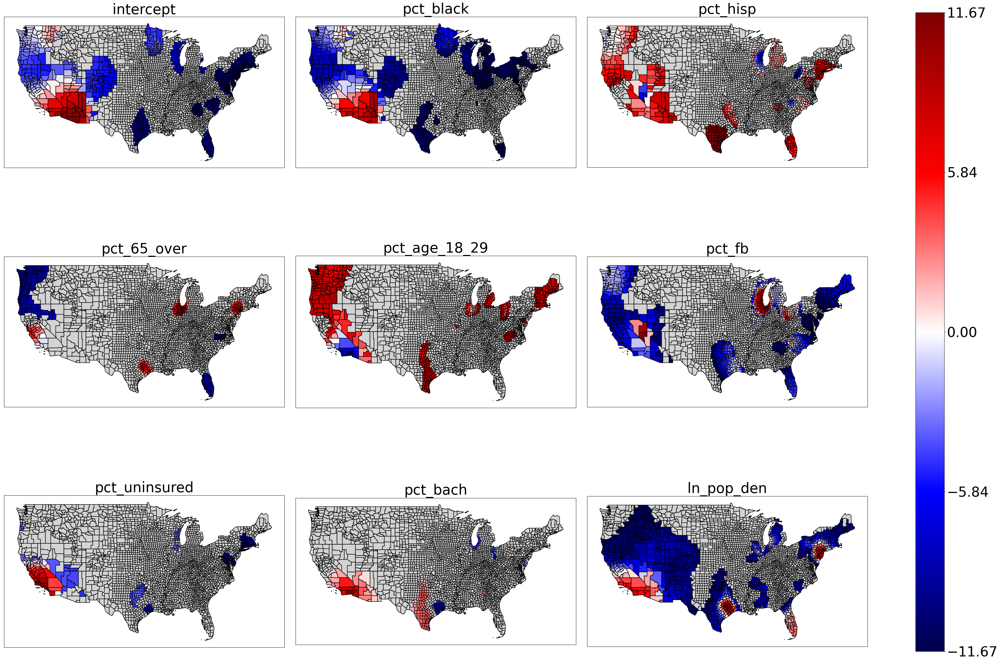

In [27]:
visualize_surfaces(merged, [
                            'intercept',
                            'pct_black',
                            'pct_hisp',
                            'pct_65_over',
                            'pct_age_18_29',
                            'pct_fb',
                            'pct_uninsured',
                            'pct_bach',
                            'ln_pop_den'
                           ], 
                           [
                            't_intercept',
                            't_pct_black',
                            't_pct_hisp',
                            't_pct_65_over',
                            't_pct_age_18_29',
                            't_pct_fb',
                            't_pct_uninsured',
                            't_pct_bach',
                            't_ln_pop_den',
                           ], use_tvalues=True)

<!-- The dependent variable here is the number of democratic votes and all these others 
are the independent variable. Thanks for watching! -->

### Two different SVC models camparisons

In [28]:
df3_.head()

,id,se0,b0,Intercept,sepct_black,bpct_black,sepct_hisp,bpct_hisp,sepct_65_over,bpct_65_over,...,bpct_age_18_29,sepct_fb,bpct_fb,sepct_uninsured,bpct_uninsured,sepct_bach,bpct_bach,seln_pop_den,bln_pop_den,geometry
0,1001,0.109232,-0.161032,1,0.036349,0.046597,0.283512,-0.126066,0.070951,0.043623,...,-0.056577,0.155654,0.188183,0.026215,0.031122,0.064936,0.099549,0.097896,0.278338,"POLYGON ((-86.91684 32.66395, -86.71225 32.661..."
1,1003,0.136123,-0.102484,1,0.053384,0.012584,0.344177,-0.064931,0.088085,0.087716,...,-0.025321,0.201540,0.212545,0.030258,0.040352,0.083381,0.062685,0.113054,0.310424,"POLYGON ((-88.00799 30.68468, -88.02593 30.753..."
2,1005,0.103428,-0.169179,1,0.038307,0.026852,0.244266,0.070468,0.067921,0.037035,...,-0.068431,0.114351,0.084628,0.028243,0.028617,0.066925,0.125253,0.095183,0.361029,"POLYGON ((-85.65700 31.88049, -85.64982 31.911..."
3,1007,0.109789,-0.163615,1,0.037532,0.056688,0.297452,-0.309765,0.070533,0.040448,...,-0.051730,0.177065,0.291477,0.025017,0.031500,0.063806,0.086583,0.098996,0.249310,"POLYGON ((-87.42293 33.00328, -87.31884 33.005..."
4,1009,0.102830,-0.209484,1,0.051780,0.100776,0.280105,-0.267604,0.064447,0.031542,...,-0.044486,0.178712,0.242935,0.023354,0.026573,0.060796,0.090904,0.099898,0.286709,"POLYGON ((-86.96350 33.85804, -86.92043 33.873..."


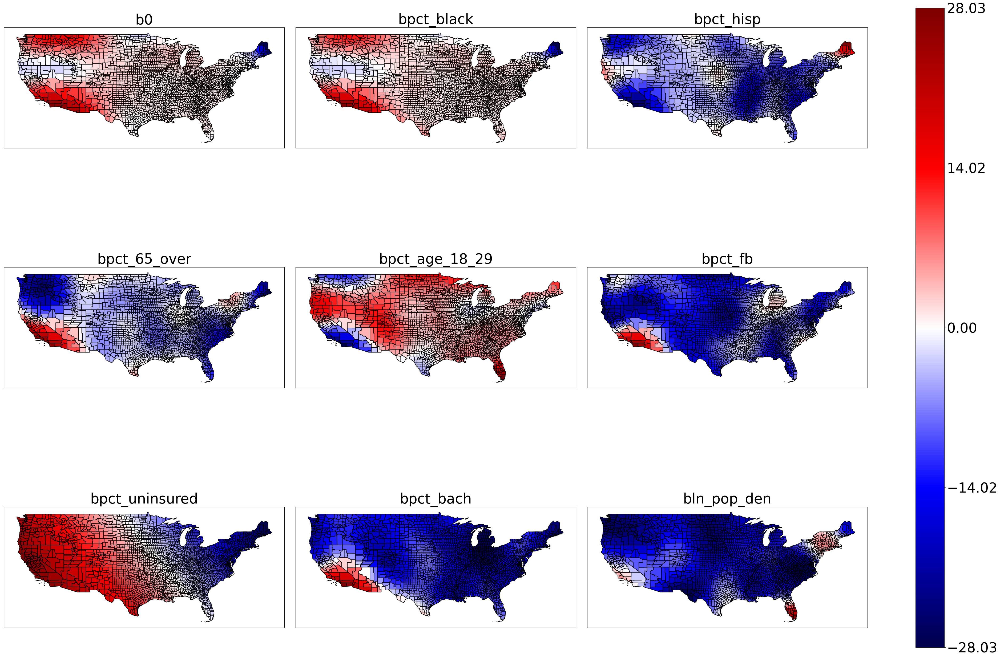

In [29]:
visualize_surfaces(df3_, [
                            'b0',
                            'bpct_black',
                            'bpct_hisp',
                            'bpct_65_over',
                            'bpct_age_18_29',
                            'bpct_fb',
                            'bpct_uninsured',
                            'bpct_bach',
                            'bln_pop_den'
                           ], 
                           [
#                             't_intercept',
#                             't_pct_black',
#                             't_pct_hisp',
#                             't_pct_65_over',
#                             't_pct_age_18_29',
#                             't_pct_fb',
#                             't_pct_uninsured',
#                             't_pct_bach',
#                             't_ln_pop_den',
                           ], use_tvalues=False)

In [30]:
import scipy.stats as stats


def mask_insignificant_t_values(df, alpha=0.05):
    """
    Calculate t-values from a dataframe containing coefficients and their standard errors.
    Mask insignificant t-values with zero.
    
    Args:
    - df (pd.DataFrame): Dataframe containing columns with coefficients (prefixed with "b") and standard errors (prefixed with "se").
    - alpha (float): Significance level. Default is 0.05 (95% confidence).
    
    Returns:
    - pd.DataFrame: A new dataframe with coefficients and t-values, where insignificant t-values are set to zero.
    """
    
    coefficient_cols = [col for col in df.columns if col.startswith("b")]
    se_cols = [col for col in df.columns if col.startswith("se")]
    
    # Check if the number of coefficient columns matches the number of standard error columns
    if len(coefficient_cols) != len(se_cols):
        raise ValueError("Mismatch in number of coefficient and standard error columns.")
    
    # Calculate t-values
    for coeff_col, se_col in zip(coefficient_cols, se_cols):
        t_value_col = f"t_{coeff_col}"
        df[t_value_col] = df[coeff_col] / df[se_col]
    
    # Calculate degrees of freedom (assuming we're in the context of linear regression)
    # df - number of predictors - 1
    degrees_of_freedom = len(df) - len(coefficient_cols) - 1
    
    # Calculate critical t-value from the t-distribution
    critical_t_value = stats.t.ppf(1 - alpha/2, degrees_of_freedom)
    
    # Mask where t-values are insignificant
    insignificant_mask = df.filter(like="t_").abs().le(critical_t_value)
    # Set t-values to zero where they are insignificant
    for t_value_col in df.filter(like="t_").columns:
        df.loc[insignificant_mask[t_value_col], t_value_col] = 0
    
    return df


In [31]:
# Test the function with the default alpha of 0.05
result_df_updated = mask_insignificant_t_values(df3_, alpha=0.05)
# ggp_tvals = result_df_updated[[col for col in result_df_updated.columns if col.startswith('t')]]


In [32]:
pd.concat([df3,ggp_tvals])

,id,se0,b0,Intercept,sepct_black,bpct_black,sepct_hisp,bpct_hisp,sepct_65_over,bpct_65_over,...,geometry,t_b0,t_bpct_black,t_bpct_hisp,t_bpct_65_over,t_bpct_age_18_29,t_bpct_fb,t_bpct_uninsured,t_bpct_bach,t_bln_pop_den
0,1001.0,0.109232,-0.161032,1.0,0.036349,0.046597,0.283512,-0.126066,0.070951,0.043623,...,"POLYGON ((-86.91684 32.66395, -86.71225 32.661...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1003.0,0.136123,-0.102484,1.0,0.053384,0.012584,0.344177,-0.064931,0.088085,0.087716,...,"POLYGON ((-88.00799 30.68468, -88.02593 30.753...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1005.0,0.103428,-0.169179,1.0,0.038307,0.026852,0.244266,0.070468,0.067921,0.037035,...,"POLYGON ((-85.65700 31.88049, -85.64982 31.911...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1007.0,0.109789,-0.163615,1.0,0.037532,0.056688,0.297452,-0.309765,0.070533,0.040448,...,"POLYGON ((-87.42293 33.00328, -87.31884 33.005...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1009.0,0.102830,-0.209484,1.0,0.051780,0.100776,0.280105,-0.267604,0.064447,0.031542,...,"POLYGON ((-86.96350 33.85804, -86.92043 33.873...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,0.0,0.0,0.0,0.0,0.0,0.000000,2.974349,0.0,5.343259
3130,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,0.0,0.0,0.0,0.0,0.0,0.000000,2.619623,0.0,2.851440
3131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,0.0,0.0,0.0,0.0,0.0,0.000000,3.001545,0.0,4.780173
3132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,0.0,0.0,0.0,0.0,0.0,1.984244,2.553666,0.0,3.510686
